<h1 style="color:Blue;background-color:white;font-size:40px">  IPL(INDIAN PREMIER LEAGUE) Data Conversion from .yaml to .xlsx 

<h1 style="color:black;background-color:white;font-size:25px">Created by Shubbh Rajehskumar Mewada. 21f1005150@student.onlinedegree.iitm.ac.in


<hr style="height:2px;border-width:0;color:gray;background-color:gray">

<p1 ><h2 style="color:blue">Step 1:</h2> Import all the neccessary libraries.<br><h2 style="color:blue">Step 2:</h2> Create a Dictionary named 'yaml2excel' in which we will store all the data from .yaml files and when all the data is finally recorded, we will convert this dictionary into a DataFrame using Pandas which will inturn be converted into Microsoft excel (.xlsx) file.<br><h2 style="color:blue">Step 3:</h2> To make this process easier, I've distinguished each and every attributes of IPL data from .yaml file into a List inorder to make it easier to record.

In [1]:
import yaml
import pandas as pd
import os

yaml2excel={}
yaml2excel['Date']=[]
yaml2excel['Venue']=[]
yaml2excel['Team 1']=[]
yaml2excel['Team 2']=[]
yaml2excel['First Inning']=[]
yaml2excel['Total Runs Scored']=[]
yaml2excel['Second Inning']=[]
yaml2excel['Total Runs Chased']=[]
yaml2excel['Team Won']=[]

<h1>

<p1><h2 style="color:blue">Step 4:</h2>: Here comes the most important part, I've created a function 'converter' which will just record all the data from the arguement 'document' which is in a dictionary format, we extracted entire data from .yaml file and converted it into dictionary. If it looks too confusing, just skip this part for the time being.<br><h2 style="color:blue">Step 5:</h2>: If you see too many 'try' and 'except' blocks, it's used incase the data from the arguement is not as per our prediction.

In [2]:
def converter(document):
    yaml2excel['Date'].append(document['info']['dates'][0])
    yaml2excel["Venue"].append(document['info']['venue'])
    yaml2excel['Team 1'].append(document['info']['teams'][0])
    yaml2excel['Team 2'].append(document['info']['teams'][1])
    yaml2excel['First Inning'].append(document['innings'][0]['1st innings']['team'])
    yaml2excel['Second Inning'].append(document['innings'][1]['2nd innings']['team'])
    sum1=0

    for i in document['innings'][0]['1st innings']['deliveries']:
        for j in i.keys():
            if f'Inning-1, Over {j}' in yaml2excel.keys() :
                yaml2excel[f'Inning-1, Over {j}'].append(i[j]['runs']['total'])
            else:
                yaml2excel[f'Inning-1, Over {j}']=[i[j]['runs']['total']]
            
            sum1+=int(i[j]['runs']['total'])

    yaml2excel['Total Runs Scored'].append(sum1)
    cond=True
    try:
        yaml2excel['Team Won'].append(document['info']['outcome']['winner'])
       
    except:
        try:
            yaml2excel['Team Won'].append(document['info']['outcome']['result'])
        except:
            yaml2excel['Team Won'].append('No Result')
            yaml2excel['Total Runs Chased'].append('0')
            cond=False
  
    if cond:
        sum1=0
        for i in document['innings'][1]['2nd innings']['deliveries']:
            for j in i.keys():
                if f'Inning-2, Over {j}' in yaml2excel.keys() :
                    yaml2excel[f'Inning-2, Over {j}'].append(i[j]['runs']['total'])

                else:
                    yaml2excel[f'Inning-2, Over {j}']=[i[j]['runs']['total']]
                sum1+=int(i[j]['runs']['total'])

        yaml2excel['Total Runs Chased'].append(sum1)


<h1>

<p1><h2 style="color:blue">Step 6:</h2>Let me explain this in a simple way, Suppose, that you have a folder named 'Messi_Left_Barca' and inside that folder you have many files and some of the files are named as 'Messi_Joined_PSG.psg', 'Neymar_In_PSG.psg', 'Ronaldo_Back_At_OldTrafford.mu'. Our aim here is to extract all those files whose extension is '.psg' from the folder 'Messi_Left_Barca'. This aim can be fullfilled by the below written code.<br><h2 style="color:blue">Step 7:</h2> We need all the files with .yaml extension.<br><h2 style="color:blue">Step 8:</h2>Just so we know that we are going in the right direction, I've added a print statement which will display our location.

In [3]:
path = "C:/Users/NND/OneDrive/Desktop/IIT-M(Statistics-2)/ipl"
os.chdir(path)

def read_yaml_file(file_path):
    with open(file_path) as f:
#         print(file_path)
        document = yaml.load(f,Loader=yaml.BaseLoader)
        converter(document)
          

for file in os.listdir():
    if file.endswith(".yaml"):
        file_path = r"{}/{}".format(path,file)
        read_yaml_file(file_path)

<h1>

<p1><h2 style="color:blue">Step 9:</h2>We convert our dictionary 'yaml2excel' into a Data Frame. <h2 style="color:blue">Step 10:</h2>We use a Function called '.to_excel' which will convert our Data Frame into an excel sheet. Hence we successfully completed our task of converting .yaml file to .xlsx file

In [4]:
df = pd.DataFrame.from_dict(yaml2excel, orient = 'index')
pd.set_option('display.max_rows',None,'display.max_columns',None)
df=df.transpose()
filename = 'IPL_Converted.xlsx'
df.to_excel(filename)

<hr style="height:2px;border-width:0;color:gray;background-color:gray">

<h1 style='color:Blue'>Data Filtering Starts from Here!!<br><br>Finding Conclusion with the Data

<h1>

<h2>1) Printing Our Data Frame. 

In [5]:
df

,Date,Venue,Team 1,Team 2,First Inning,Total Runs Scored,Second Inning,Total Runs Chased,Team Won,"Inning-1, Over 0.1","Inning-1, Over 0.2","Inning-1, Over 0.3","Inning-1, Over 0.4","Inning-1, Over 0.5","Inning-1, Over 0.6","Inning-1, Over 0.7","Inning-1, Over 1.1","Inning-1, Over 1.2","Inning-1, Over 1.3","Inning-1, Over 1.4","Inning-1, Over 1.5","Inning-1, Over 1.6","Inning-1, Over 1.7","Inning-1, Over 2.1","Inning-1, Over 2.2","Inning-1, Over 2.3","Inning-1, Over 2.4","Inning-1, Over 2.5","Inning-1, Over 2.6","Inning-1, Over 3.1","Inning-1, Over 3.2","Inning-1, Over 3.3","Inning-1, Over 3.4","Inning-1, Over 3.5","Inning-1, Over 3.6","Inning-1, Over 4.1","Inning-1, Over 4.2","Inning-1, Over 4.3","Inning-1, Over 4.4","Inning-1, Over 4.5","Inning-1, Over 4.6","Inning-1, Over 5.1","Inning-1, Over 5.2","Inning-1, Over 5.3","Inning-1, Over 5.4","Inning-1, Over 5.5","Inning-1, Over 5.6","Inning-1, Over 6.1","Inning-1, Over 6.2","Inning-1, Over 6.3","Inning-1, Over 6.4","Inning-1, Over 6.5","Inning-1, Over 6.6","Inning-1, Over 7.1","Inning-1, Over 7.2","Inning-1, Over 7.3","Inning-1, Over 7.4","Inning-1, Over 7.5","Inning-1, Over 7.6","Inning-1, Over 8.1","Inning-1, Over 8.2","Inning-1, Over 8.3","Inning-1, Over 8.4","Inning-1, Over 8.5","Inning-1, Over 8.6","Inning-1, Over 9.1","Inning-1, Over 9.2","Inning-1, Over 9.3","Inning-1, Over 9.4","Inning-1, Over 9.5","Inning-1, Over 9.6","Inning-1, Over 10.1","Inning-1, Over 10.2","Inning-1, Over 10.3","Inning-1, Over 10.4","Inning-1, Over 10.5","Inning-1, Over 10.6","Inning-1, Over 11.1","Inning-1, Over 11.2","Inning-1, Over 11.3","Inning-1, Over 11.4","Inning-1, Over 11.5","Inning-1, Over 11.6","Inning-1, Over 12.1","Inning-1, Over 12.2","Inning-1, Over 12.3","Inning-1, Over 12.4","Inning-1, Over 12.5","Inning-1, Over 12.6","Inning-1, Over 12.7","Inning-1, Over 13.1","Inning-1, Over 13.2","Inning-1, Over 13.3","Inning-1, Over 13.4","Inning-1, Over 13.5","Inning-1, Over 13.6","Inning-1, Over 14.1","Inning-1, Over 14.2","Inning-1, Over 14.3","Inning-1, Over 14.4","Inning-1, Over 14.5","Inning-1, Over 14.6","Inning-1, Over 15.1","Inning-1, Over 15.2","Inning-1, Over 15.3","Inning-1, Over 15.4","Inning-1, Over 15.5","Inning-1, Over 15.6","Inning-1, Over 16.1","Inning-1, Over 16.2","Inning-1, Over 16.3","Inning-1, Over 16.4","Inning-1, Over 16.5","Inning-1, Over 16.6","Inning-1, Over 17.1","Inning-1, Over 17.2","Inning-1, Over 17.3","Inning-1, Over 17.4","Inning-1, Over 17.5","Inning-1, Over 17.6","Inning-1, Over 17.7","Inning-1, Over 17.8","Inning-1, Over 18.1","Inning-1, Over 18.2","Inning-1, Over 18.3","Inning-1, Over 18.4","Inning-1, Over 18.5","Inning-1, Over 18.6","Inning-1, Over 19.1","Inning-1, Over 19.2","Inning-1, Over 19.3","Inning-1, Over 19.4","Inning-1, Over 19.5","Inning-1, Over 19.6","Inning-2, Over 0.1","Inning-2, Over 0.2","Inning-2, Over 0.3","Inning-2, Over 0.4","Inning-2, Over 0.5","Inning-2, Over 0.6","Inning-2, Over 1.1","Inning-2, Over 1.2","Inning-2, Over 1.3","Inning-2, Over 1.4","Inning-2, Over 1.5","Inning-2, Over 1.6","Inning-2, Over 2.1","Inning-2, Over 2.2","Inning-2, Over 2.3","Inning-2, Over 2.4","Inning-2, Over 2.5","Inning-2, Over 2.6","Inning-2, Over 3.1","Inning-2, Over 3.2","Inning-2, Over 3.3","Inning-2, Over 3.4","Inning-2, Over 3.5","Inning-2, Over 3.6","Inning-2, Over 3.7","Inning-2, Over 4.1","Inning-2, Over 4.2","Inning-2, Over 4.3","Inning-2, Over 4.4","Inning-2, Over 4.5","Inning-2, Over 4.6","Inning-2, Over 4.7","Inning-2, Over 5.1","Inning-2, Over 5.2","Inning-2, Over 5.3","Inning-2, Over 5.4","Inning-2, Over 5.5","Inning-2, Over 5.6","Inning-2, Over 6.1","Inning-2, Over 6.2","Inning-2, Over 6.3","Inning-2, Over 6.4","Inning-2, Over 6.5","Inning-2, Over 6.6","Inning-2, Over 7.1","Inning-2, Over 7.2","Inning-2, Over 7.3","Inning-2, Over 7.4","Inning-2, Over 7.5","Inning-2, Over 7.6","Inning-2, Over 8.1","Inning-2, Over 8.2","Inning-2, Over 8.3","Inning-2, Over 8.4","Inning-2, Over 8.5","Inning-2, Over 8.6","Inning-2, Over 8.7","Inning-2, Over 9

<h1>

<h1>Which Team has won the most number of times?

<h2 style='color:blue'>Using Filters and Grouping the data.

In [6]:
new_df = df.groupby('Team Won')['Team Won'].count().sort_values(ascending = False).reset_index(name = 'Total Wins')
new_df = pd.DataFrame(new_df)


<h2 style='color:blue'>After Using Filters.

In [7]:
new_df

,Team Won,Total Wins
0,Mumbai Indians,122
1,Chennai Super Kings,111
2,Kolkata Knight Riders,100
3,Royal Challengers Bangalore,94
4,Kings XI Punjab,85
5,Rajasthan Royals,82
6,Delhi Daredevils,67
7,Sunrisers Hyderabad,66
8,Deccan Chargers,29
9,Delhi Capitals,22


<h2 style='color:blue'>Graphical Representation.

<AxesSubplot:xlabel='Team Won'>

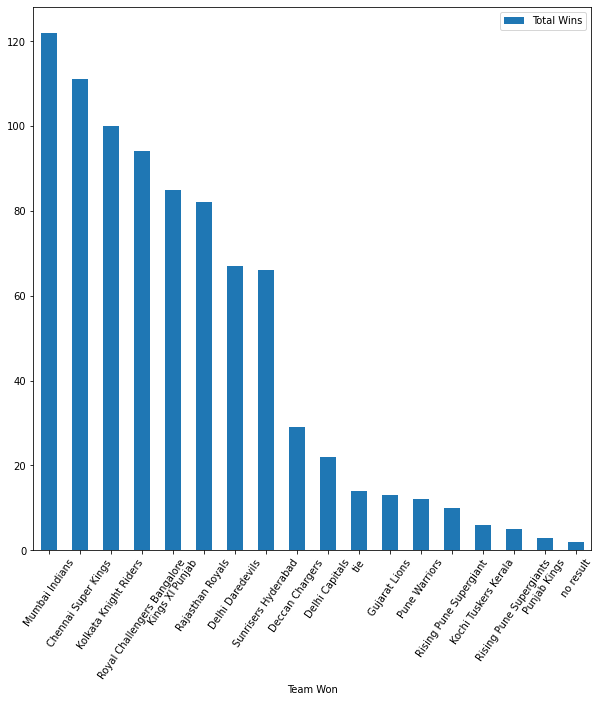

In [8]:
new_df.plot.bar(x='Team Won',y='Total Wins',rot=55,figsize=(10,10))

<h1 style="color:black;background-color:white;font-size:25px">Created by Shubbh Rajehskumar Mewada. 21f1005150@student.onlinedegree.iitm.ac.in
